In [ ]:
!nvidia-smi
!pip install opencv-python
!apt-get install libgl1-mesa-glx -y

Tue Nov 19 07:17:00 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Import the required libraries

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import itertools
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Prepare the datasets

In [ ]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip chest-xray-pneumonia.zip
!ls chest_xray/train

Streaming output truncated to the last 5000 lines.
  inflating: chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0446-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0447-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0448-0001.jpeg  
  inflating: ches

In [ ]:
CLASS_NAMES = ["NORMAL", "PNEUMONIA"]
train_ds = tf.keras.preprocessing.image_dataset_from_directory("chest_xray/train", label_mode="categorical",
                                                               class_names=CLASS_NAMES, image_size=(224, 224),
                                                               shuffle=True, seed=42, batch_size=None)
test_ds = tf.keras.preprocessing.image_dataset_from_directory("chest_xray/train", label_mode="categorical",
                                                              class_names=CLASS_NAMES, image_size=(224, 224),
                                                              shuffle=True, seed=42, batch_size=None)
val_ds = tf.keras.preprocessing.image_dataset_from_directory("chest_xray/train", label_mode="categorical",
                                                             class_names=CLASS_NAMES, image_size=(224, 224),
                                                             shuffle=True, seed=42, batch_size=None)

Found 5216 files belonging to 2 classes.
Found 5216 files belonging to 2 classes.
Found 5216 files belonging to 2 classes.


# Show some sample images

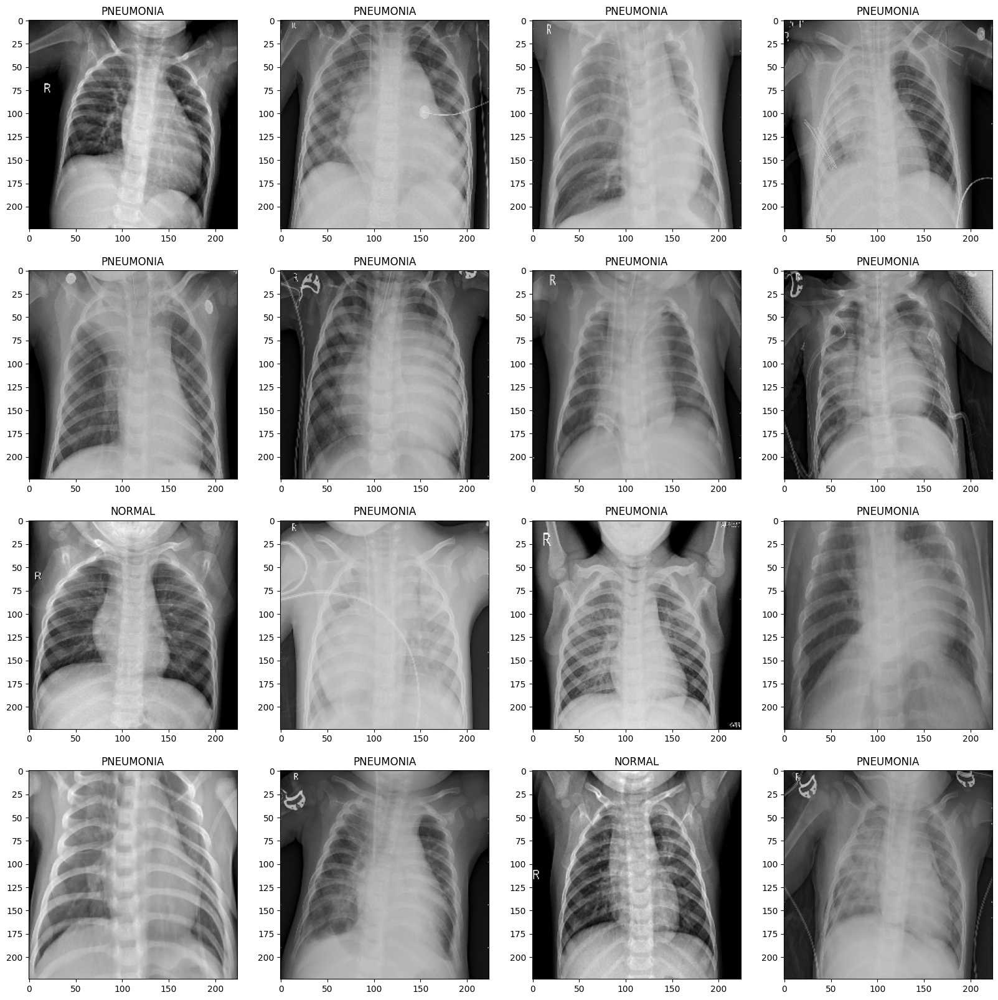

In [ ]:
row, col = 4, 4
fig, axes = plt.subplots(row, col, figsize=(20, 20))

for index, x in enumerate(train_ds):
    axes[index // row, index % col].imshow(x[0].numpy().astype(int))
    axes[index // row, index % col].set_title(CLASS_NAMES[x[1].numpy().argmax()])

    if index == (row * col) - 1:
        break

plt.show()


# Prepare dataset for training

In [ ]:
BATCH_SIZE = 32
IMG_SIZE = [256, 256]

def func(image, label):
    return tf.image.resize(image, IMG_SIZE), label

train = train_ds.map(func).batch(BATCH_SIZE).shuffle(1000).prefetch(tf.data.AUTOTUNE).cache()
test = test_ds.map(func).batch(BATCH_SIZE).shuffle(1000).prefetch(tf.data.AUTOTUNE)
val = val_ds.map(func).batch(BATCH_SIZE).shuffle(1000).prefetch(tf.data.AUTOTUNE)

# VGG16 Model

In [ ]:
def create_model():
    vgg16 = tf.keras.applications.VGG16(include_top=False, weights="imagenet", input_shape=IMG_SIZE + [3])
    vgg16.trainable = False
    x = tf.keras.layers.GlobalAveragePooling2D()(vgg16.output)
    outputs = tf.keras.layers.Dense(len(CLASS_NAMES), activation="softmax")(x)
    model = tf.keras.Model(inputs=vgg16.input, outputs=outputs)

    model.compile(
        loss="categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    return model

model = create_model()
model.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 256, 256, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 128, 128, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2)                   │           1,0

 Total params: 14,715,714 (56.14 MB)

 Trainable params: 1,026 (4.01 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
class ModelCheckpointCustom(tf.keras.callbacks.Callback):

    def __init__(self, model_path, save_best_only=False):
        super(ModelCheckpointCustom, self).__init__()

        self.model_path = model_path
        self.save_best_only = save_best_only
        self.best_val_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):

        current_val_loss = 0 if logs['val_loss'] is None else logs['val_loss']

        if self.save_best_only and current_val_loss < self.best_val_loss:
            self.best_val_loss = current_val_loss
            self.model.save_weights(self.model_path)
        else:
            self.model.save_weights(self.model_path)

save_callbacks = ModelCheckpointCustom(model_path='/content/modelvgg16.weights.h5', save_best_only=True)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=5)

In [ ]:
EPOCHS = 10
history = model.fit(train, epochs=EPOCHS, validation_data=val, validation_steps=int(len(val) * .2),
                    callbacks=[early_stopping, save_callbacks])

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 131s 466ms/step - accuracy: 0.8101 - loss: 0.5347 - val_accuracy: 0.9326 - val_loss: 0.1699
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 192ms/step - accuracy: 0.9389 - loss: 0.1641 - val_accuracy: 0.9531 - val_loss: 0.1263
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 186ms/step - accuracy: 0.9521 - loss: 0.1205 - val_accuracy: 0.9678 - val_loss: 0.0920
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 185ms/step - accuracy: 0.9588 - loss: 0.0995 - val_accuracy: 0.9668 - val_loss: 0.0887
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 188ms/step - accuracy: 0.9690 - loss: 0.0873 - val_accuracy: 0.9736 - val_loss: 0.0623
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - accuracy: 0.9723 - loss: 0.0790 - val_accuracy: 0.9792 - val_loss: 0.0341
Epoch 7/10


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


163/163 ━━━━━━━━━━━━━━━━━━━━ 69s 425ms/step - accuracy: 0.9743 - loss: 0.0729 - val_accuracy: 0.9746 - val_loss: 0.0730
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 191ms/step - accuracy: 0.9761 - loss: 0.0680 - val_accuracy: 0.9707 - val_loss: 0.0685
Epoch 9/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 40s 186ms/step - accuracy: 0.9775 - loss: 0.0640 - val_accuracy: 0.9824 - val_loss: 0.0527
Epoch 10/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 42s 190ms/step - accuracy: 0.9773 - loss: 0.0605 - val_accuracy: 0.9775 - val_loss: 0.0454


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


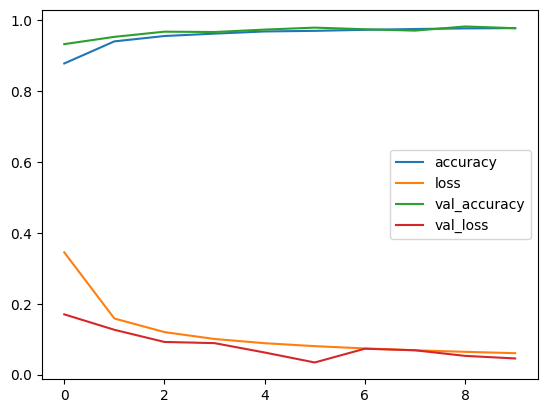

In [ ]:
pd.DataFrame(history.history).plot()
loaded_model = create_model()
loaded_model.load_weights("/content/modelvgg16.weights.h5")

In [ ]:
y_pred = loaded_model.evaluate(test)
print("Testing accuracy:", y_pred[1])

163/163 ━━━━━━━━━━━━━━━━━━━━ 66s 158ms/step - accuracy: 0.9821 - loss: 0.0472
Testing accuracy: 0.981019914150238


Accuracy: 0.9810199386503068
Precision: 0.9791810765187625
Recall: 0.9708896105458131
F1-score: 0.9749412029323195


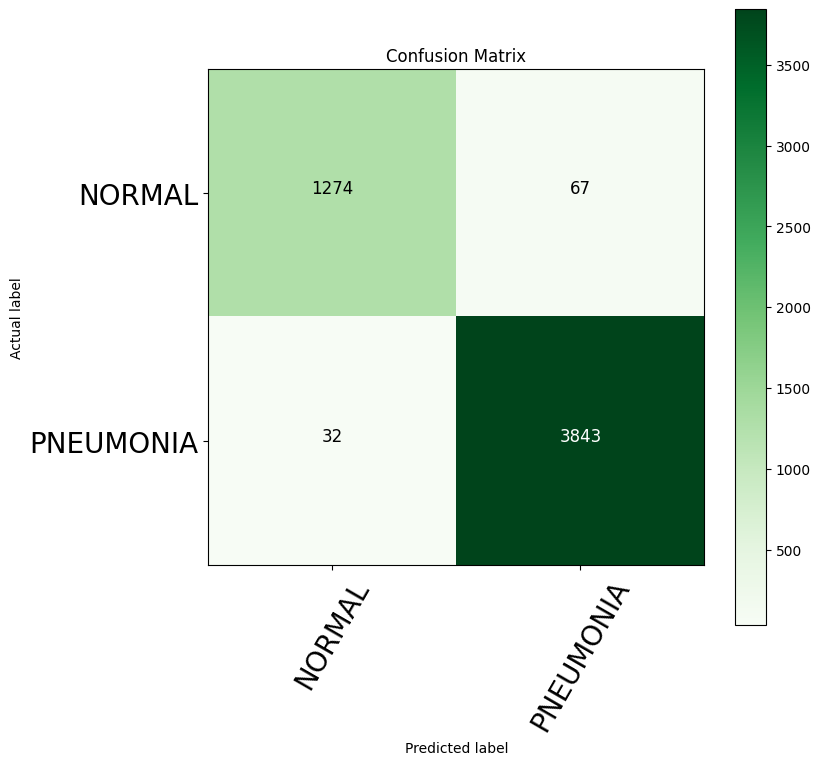

In [ ]:
def conf_matrix(y_test=None, y_pred=None, class_names=None):

    cm = confusion_matrix(y_test, y_pred)

    fig, ax = plt.subplots(figsize=(8, 8))
    a = ax.matshow(cm, cmap=plt.cm.Greens)

    fig.colorbar(a)

    ax.set(title="Confusion Matrix",
             xlabel="Predicted label",
             ylabel="Actual label",
             xticks=np.arange(len(class_names)),
             yticks=np.arange(len(class_names)),
             xticklabels=class_names,
             yticklabels=class_names)

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=60, fontsize=20)
    plt.yticks(fontsize=20)

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i, j]}",
                  horizontalalignment="center", color="black" if cm[i, j] < (cm.max() + cm.min()) / 2 else "white",
                  fontsize=12)
y_pred = []
y_truth = []

for x, y in test:
    y_pred.extend(loaded_model.predict([x], verbose=0).round())
    y_truth.extend(y.numpy())

y_true = np.array(y_truth).argmax(axis=1)
y_prediction = np.array(y_pred).argmax(axis=1)
accuracy = accuracy_score(y_true, y_prediction)
precision = precision_score(y_true, y_prediction, average='macro')
recall = recall_score(y_true, y_prediction, average='macro')
f1 = f1_score(y_true, y_prediction, average='macro')
confusion_mat = confusion_matrix(y_true, y_prediction)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
conf_matrix(y_test=y_true, y_pred=y_prediction, class_names=CLASS_NAMES)

<ipython-input-14-1aa8f9387c81>:28: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap)
<ipython-input-14-1aa8f9387c81>:10: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)


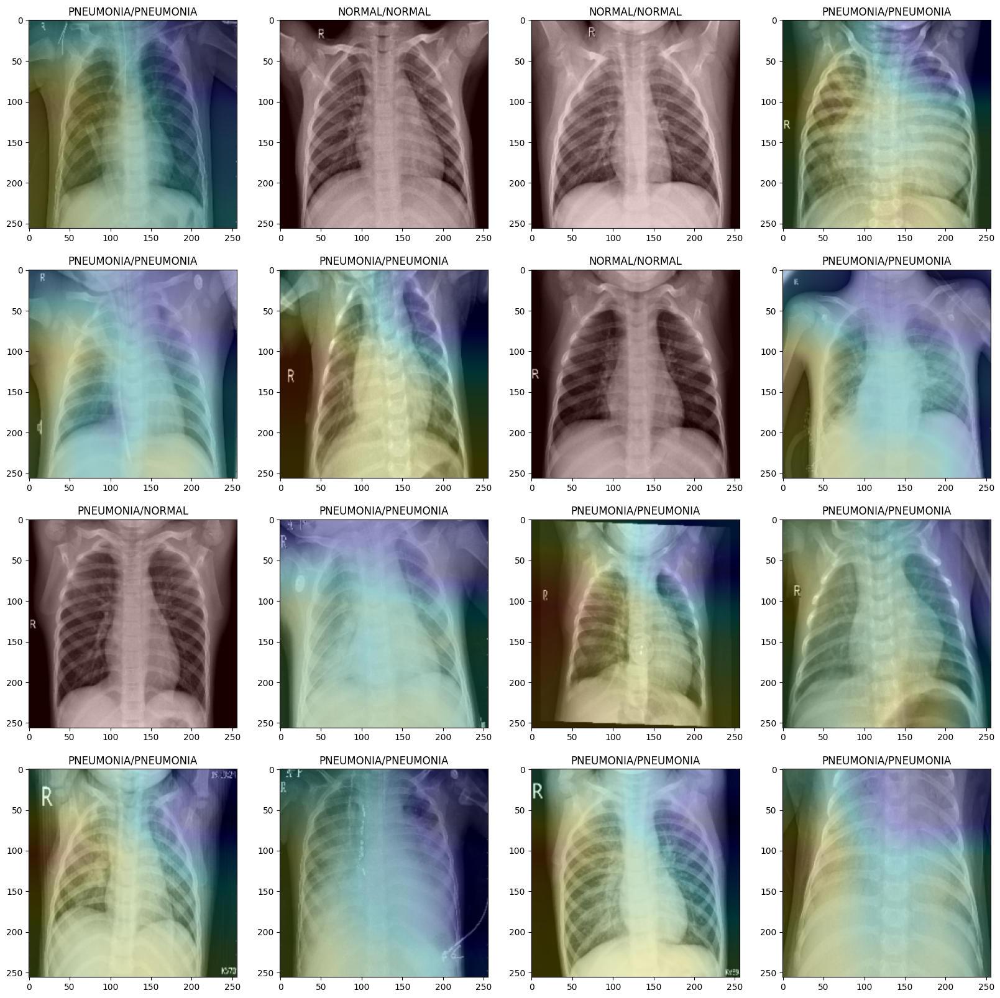

In [ ]:
class GradCAM(object):
    def __init__(self, model, alpha=0.8, beta=0.3):

        self.model = model
        self.alpha = alpha
        self.beta = beta

    def apply_heatmap(self, heatmap, image):
        heatmap = cv2.resize(heatmap, image.shape[:-1])
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(np.array(image).astype(np.float32), self.alpha,
                                           np.array(heatmap).astype(np.float32), self.beta, 0)

        return np.array(superimposed_img).astype(np.uint8)

    def gradCAM(self, x_test=None, name='black_max_pool_2', index_class=0):

        with tf.GradientTape() as tape:
            last_conv_layer = self.model.get_layer(name)
            grad_model = tf.keras.Model([self.model.input], [self.model.output, last_conv_layer.output])
            model_out, last_conv_layer = grad_model(np.expand_dims(x_test, axis=0))
            class_out = model_out[:, index_class]
            grads = tape.gradient(class_out, last_conv_layer)
            pooled_grads = tf.reduce_mean(grads, axis=(0, 3))
            last_conv_layer = tf.reduce_mean(last_conv_layer, axis=(0, 3))
        heatmap = tf.multiply(pooled_grads, last_conv_layer)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        heatmap = np.array(heatmap)
        return self.apply_heatmap(heatmap, x_test)
gradCam = GradCAM(loaded_model, alpha=0.8, beta=0.2)

row, col = 4, 4
fig, axes = plt.subplots(row, col, figsize=(20, 20))
for index, x in enumerate(test_ds.take(row * col)):
    x_test, y_test = x
    x_test = tf.image.resize(x_test, IMG_SIZE)
    y_pred = loaded_model.predict(tf.expand_dims(x_test, axis=0), verbose=0).argmax()
    grad_heatmap = gradCam.gradCAM(x_test, name='block5_conv3', index_class=y_test.numpy().argmax())
    axes[index // row, index % col].imshow(grad_heatmap)
    axes[index // row, index % col].set_title(f"{CLASS_NAMES[y_pred]}/{CLASS_NAMES[y_test.numpy().argmax()]}")

    if index == (row * col) - 1:
        break

plt.show()

# ResNet50 Model

In [ ]:
def create_model():
    resnet50 = tf.keras.applications.ResNet50(include_top=False, weights="imagenet", input_shape=IMG_SIZE + [3])
    resnet50.trainable = False
    x = tf.keras.layers.GlobalAveragePooling2D()(resnet50.output)
    outputs = tf.keras.layers.Dense(len(CLASS_NAMES), activation="softmax")(x)
    model = tf.keras.Model(inputs=resnet50.input, outputs=outputs)

    model.compile(
        loss="categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    return model


model = create_model()
model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 262, 262, 3)    │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 64, 64, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 64, 64, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 64, 64, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,591,810 (90.00 MB)

 Trainable params: 4,098 (16.01 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
class ModelCheckpointCustom(tf.keras.callbacks.Callback):

    def __init__(self, model_path, save_best_only=False):
        super(ModelCheckpointCustom, self).__init__()

        self.model_path = model_path
        self.save_best_only = save_best_only
        self.best_val_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):

        current_val_loss = 0 if logs['val_loss'] is None else logs['val_loss']

        if self.save_best_only and current_val_loss < self.best_val_loss:
            self.best_val_loss = current_val_loss
            self.model.save_weights(self.model_path)
        else:
            self.model.save_weights(self.model_path)

save_callbacks = ModelCheckpointCustom(model_path='/content/modelresnet50.weights.h5', save_best_only=True)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=5)


In [ ]:
EPOCHS = 10
history = model.fit(train, epochs=EPOCHS, validation_data=val, validation_steps=int(len(val) * .2),
                    callbacks=[early_stopping, save_callbacks])

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 122s 446ms/step - accuracy: 0.8704 - loss: 0.2598 - val_accuracy: 0.9727 - val_loss: 0.0820
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - accuracy: 0.9668 - loss: 0.0915 - val_accuracy: 0.9727 - val_loss: 0.0814
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - accuracy: 0.9727 - loss: 0.0717 - val_accuracy: 0.9824 - val_loss: 0.0528
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - accuracy: 0.9777 - loss: 0.0611 - val_accuracy: 0.9805 - val_loss: 0.0557
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - accuracy: 0.9814 - loss: 0.0537 - val_accuracy: 0.9883 - val_loss: 0.0435
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.9830 - loss: 0.0480

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


163/163 ━━━━━━━━━━━━━━━━━━━━ 67s 416ms/step - accuracy: 0.9830 - loss: 0.0481 - val_accuracy: 0.9896 - val_loss: 0.0436
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 73s 363ms/step - accuracy: 0.9860 - loss: 0.0435 - val_accuracy: 0.9863 - val_loss: 0.0411
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - accuracy: 0.9871 - loss: 0.0395 - val_accuracy: 0.9854 - val_loss: 0.0429
Epoch 9/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - accuracy: 0.9880 - loss: 0.0362 - val_accuracy: 0.9902 - val_loss: 0.0276
Epoch 10/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - accuracy: 0.9885 - loss: 0.0332 - val_accuracy: 0.9912 - val_loss: 0.0342


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


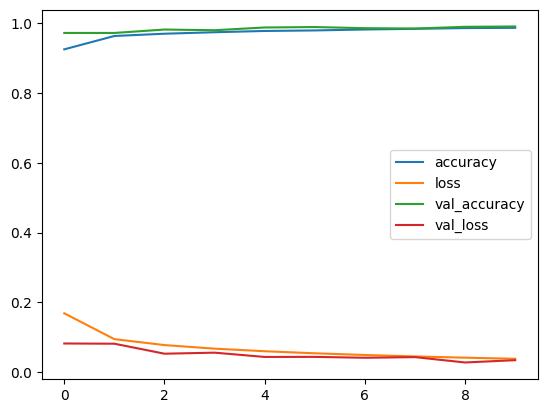

In [ ]:
pd.DataFrame(history.history).plot()
loaded_model = create_model()
loaded_model.load_weights("/content/modelresnet50.weights.h5")

In [ ]:
y_pred = loaded_model.evaluate(test)
print("Testing accuracy:", y_pred[1])

163/163 ━━━━━━━━━━━━━━━━━━━━ 62s 104ms/step - accuracy: 0.9905 - loss: 0.0317
Testing accuracy: 0.9906058311462402


Accuracy: 0.9906058282208589
Precision: 0.985554979253112
Recall: 0.9900200620624955
F1-score: 0.9877602258197726


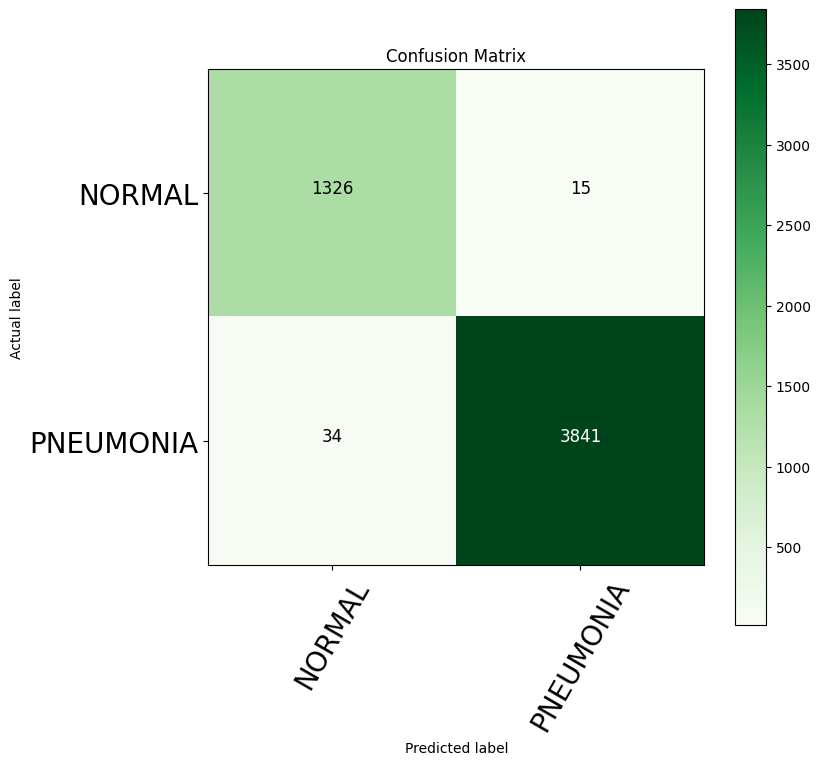

In [ ]:
def conf_matrix(y_test=None, y_pred=None, class_names=None):

    cm = confusion_matrix(y_test, y_pred)

    fig, ax = plt.subplots(figsize=(8, 8))
    a = ax.matshow(cm, cmap=plt.cm.Greens)

    fig.colorbar(a)

    ax.set(title="Confusion Matrix",
             xlabel="Predicted label",
             ylabel="Actual label",
             xticks=np.arange(len(class_names)),
             yticks=np.arange(len(class_names)),
             xticklabels=class_names,
             yticklabels=class_names)

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=60, fontsize=20)
    plt.yticks(fontsize=20)

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i, j]}",
                  horizontalalignment="center", color="black" if cm[i, j] < (cm.max() + cm.min()) / 2 else "white",
                  fontsize=12)
y_pred = []
y_truth = []

for x, y in test:
    y_pred.extend(loaded_model.predict([x], verbose=0).round())
    y_truth.extend(y.numpy())

y_true = np.array(y_truth).argmax(axis=1)
y_prediction = np.array(y_pred).argmax(axis=1)
accuracy = accuracy_score(y_true, y_prediction)
precision = precision_score(y_true, y_prediction, average='macro')
recall = recall_score(y_true, y_prediction, average='macro')
f1 = f1_score(y_true, y_prediction, average='macro')
confusion_mat = confusion_matrix(y_true, y_prediction)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
conf_matrix(y_test=y_true, y_pred=y_prediction, class_names=CLASS_NAMES)

<ipython-input-17-012f61abc8aa>:28: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap)
<ipython-input-17-012f61abc8aa>:10: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)


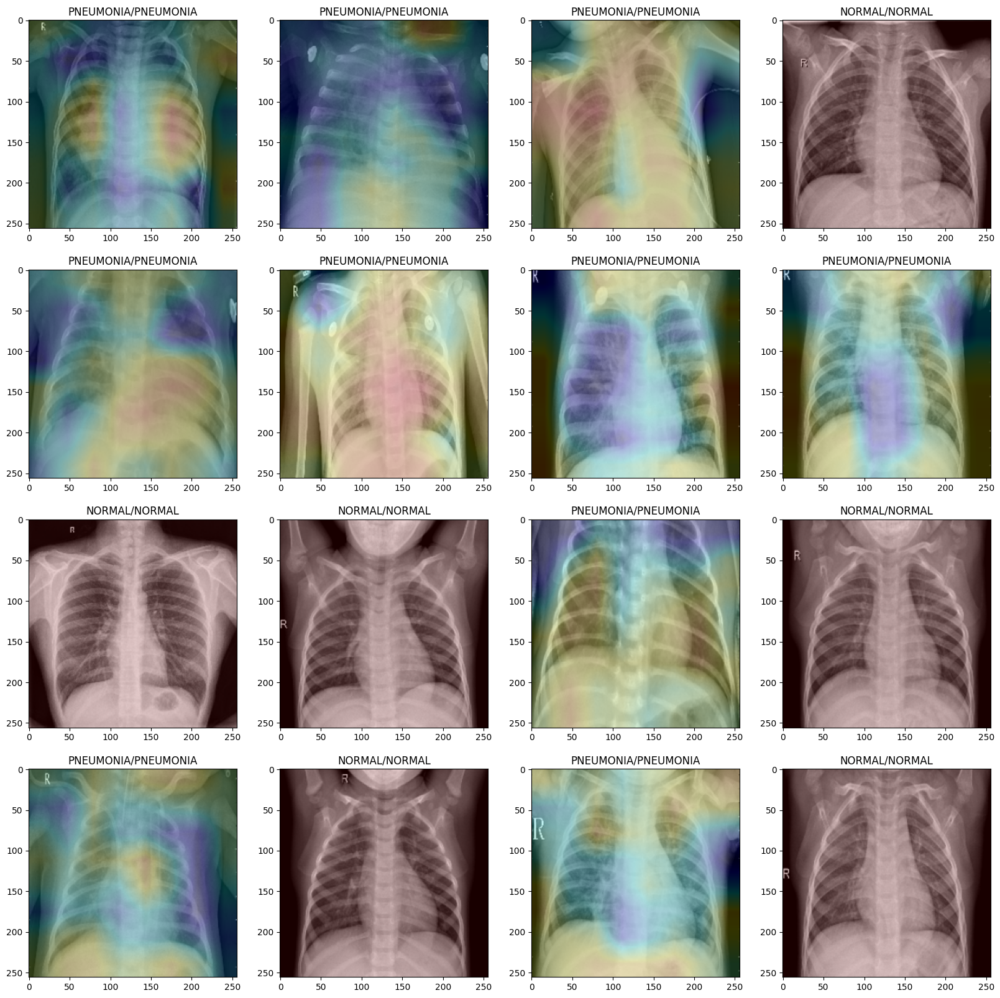

In [ ]:
class GradCAM(object):
    def __init__(self, model, alpha=0.8, beta=0.3):

        self.model = model
        self.alpha = alpha
        self.beta = beta

    def apply_heatmap(self, heatmap, image):
        heatmap = cv2.resize(heatmap, image.shape[:-1])
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(np.array(image).astype(np.float32), self.alpha,
                                           np.array(heatmap).astype(np.float32), self.beta, 0)

        return np.array(superimposed_img).astype(np.uint8)

    def gradCAM(self, x_test=None, name='black_max_pool_2', index_class=0):

        with tf.GradientTape() as tape:
            last_conv_layer = self.model.get_layer(name)
            grad_model = tf.keras.Model([self.model.input], [self.model.output, last_conv_layer.output])
            model_out, last_conv_layer = grad_model(np.expand_dims(x_test, axis=0))
            class_out = model_out[:, index_class]
            grads = tape.gradient(class_out, last_conv_layer)
            pooled_grads = tf.reduce_mean(grads, axis=(0, 3))
            last_conv_layer = tf.reduce_mean(last_conv_layer, axis=(0, 3))
        heatmap = tf.multiply(pooled_grads, last_conv_layer)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        heatmap = np.array(heatmap)
        return self.apply_heatmap(heatmap, x_test)
gradCam = GradCAM(loaded_model, alpha=0.8, beta=0.2)

row, col = 4, 4
fig, axes = plt.subplots(row, col, figsize=(20, 20))
for index, x in enumerate(test_ds.take(row * col)):
    x_test, y_test = x
    x_test = tf.image.resize(x_test, IMG_SIZE)
    y_pred = loaded_model.predict(tf.expand_dims(x_test, axis=0), verbose=0).argmax()
    grad_heatmap = gradCam.gradCAM(x_test, name='conv5_block3_out', index_class=y_test.numpy().argmax())
    axes[index // row, index % col].imshow(grad_heatmap)
    axes[index // row, index % col].set_title(f"{CLASS_NAMES[y_pred]}/{CLASS_NAMES[y_test.numpy().argmax()]}")

    if index == (row * col) - 1:
        break

plt.show()

# ResNet101 Model

In [ ]:
import tensorflow as tf

def create_model():
    resnet101 = tf.keras.applications.ResNet101(include_top=False, weights="imagenet", input_shape=IMG_SIZE + [3])
    resnet101.trainable = False
    x = tf.keras.layers.GlobalAveragePooling2D()(resnet101.output)
    outputs = tf.keras.layers.Dense(len(CLASS_NAMES), activation="softmax")(x)
    model = tf.keras.Model(inputs=resnet101.input, outputs=outputs)

    model.compile(
        loss="categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

model = create_model()
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 262, 262, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 64, 64, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 64, 64, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 64, 64, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 42,662,274 (162.74 MB)

 Trainable params: 4,098 (16.01 KB)

 Non-trainable params: 42,658,176 (162.73 MB)

In [ ]:
class ModelCheckpointCustom(tf.keras.callbacks.Callback):

    def __init__(self, model_path, save_best_only=False):
        super(ModelCheckpointCustom, self).__init__()

        self.model_path = model_path
        self.save_best_only = save_best_only
        self.best_val_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):

        current_val_loss = 0 if logs['val_loss'] is None else logs['val_loss']

        if self.save_best_only and current_val_loss < self.best_val_loss:
            self.best_val_loss = current_val_loss
            self.model.save_weights(self.model_path)
        else:
            self.model.save_weights(self.model_path)

save_callbacks = ModelCheckpointCustom(model_path='/content/modelresnet101.weights.h5', save_best_only=True)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=5)


In [ ]:
EPOCHS = 10
history = model.fit(train, epochs=EPOCHS, validation_data=val, validation_steps=int(len(val) * .2),
                    callbacks=[early_stopping, save_callbacks])

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 144s 542ms/step - accuracy: 0.8743 - loss: 0.2772 - val_accuracy: 0.9580 - val_loss: 0.1146
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 47s 231ms/step - accuracy: 0.9658 - loss: 0.1024 - val_accuracy: 0.9658 - val_loss: 0.0934
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 39s 220ms/step - accuracy: 0.9726 - loss: 0.0831 - val_accuracy: 0.9785 - val_loss: 0.0553
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9754 - loss: 0.0717 - val_accuracy: 0.9805 - val_loss: 0.0572
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 40s 219ms/step - accuracy: 0.9787 - loss: 0.0636 - val_accuracy: 0.9756 - val_loss: 0.0622
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.9796 - loss: 0.0574

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


163/163 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - accuracy: 0.9796 - loss: 0.0574 - val_accuracy: 0.9896 - val_loss: 0.0445
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 76s 468ms/step - accuracy: 0.9819 - loss: 0.0524 - val_accuracy: 0.9844 - val_loss: 0.0414
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - accuracy: 0.9841 - loss: 0.0481 - val_accuracy: 0.9844 - val_loss: 0.0466
Epoch 9/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 36s 219ms/step - accuracy: 0.9867 - loss: 0.0445 - val_accuracy: 0.9814 - val_loss: 0.0502
Epoch 10/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - accuracy: 0.9879 - loss: 0.0413 - val_accuracy: 0.9717 - val_loss: 0.0582


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


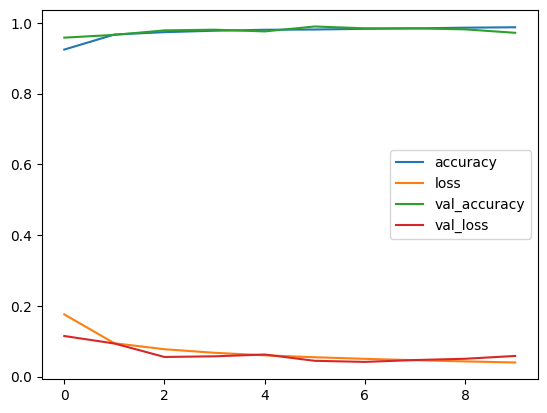

In [ ]:
pd.DataFrame(history.history).plot()
loaded_model = create_model()
loaded_model.load_weights("/content/modelresnet101.weights.h5")

In [ ]:
y_pred = loaded_model.evaluate(test)
print("Testing accuracy:", y_pred[1])

163/163 ━━━━━━━━━━━━━━━━━━━━ 84s 185ms/step - accuracy: 0.9814 - loss: 0.0485
Testing accuracy: 0.9798696041107178


Accuracy: 0.9798696319018405
Precision: 0.985678284972298
Recall: 0.9618254071347815
F1-score: 0.973000067292777


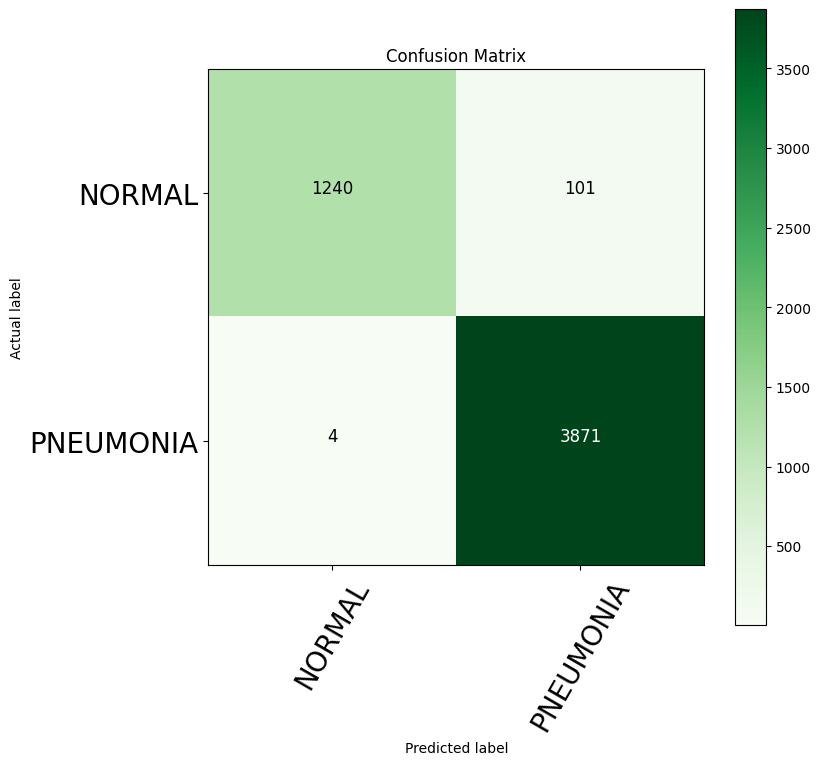

In [ ]:
def conf_matrix(y_test=None, y_pred=None, class_names=None):

    cm = confusion_matrix(y_test, y_pred)

    fig, ax = plt.subplots(figsize=(8, 8))
    a = ax.matshow(cm, cmap=plt.cm.Greens)

    fig.colorbar(a)

    ax.set(title="Confusion Matrix",
             xlabel="Predicted label",
             ylabel="Actual label",
             xticks=np.arange(len(class_names)),
             yticks=np.arange(len(class_names)),
             xticklabels=class_names,
             yticklabels=class_names)

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=60, fontsize=20)
    plt.yticks(fontsize=20)

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i, j]}",
                  horizontalalignment="center", color="black" if cm[i, j] < (cm.max() + cm.min()) / 2 else "white",
                  fontsize=12)
y_pred = []
y_truth = []

for x, y in test:
    y_pred.extend(loaded_model.predict([x], verbose=0).round())
    y_truth.extend(y.numpy())

y_true = np.array(y_truth).argmax(axis=1)
y_prediction = np.array(y_pred).argmax(axis=1)
accuracy = accuracy_score(y_true, y_prediction)
precision = precision_score(y_true, y_prediction, average='macro')
recall = recall_score(y_true, y_prediction, average='macro')
f1 = f1_score(y_true, y_prediction, average='macro')
confusion_mat = confusion_matrix(y_true, y_prediction)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
conf_matrix(y_test=y_true, y_pred=y_prediction, class_names=CLASS_NAMES)

<ipython-input-15-e8718c1b0192>:28: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap)
<ipython-input-15-e8718c1b0192>:10: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)


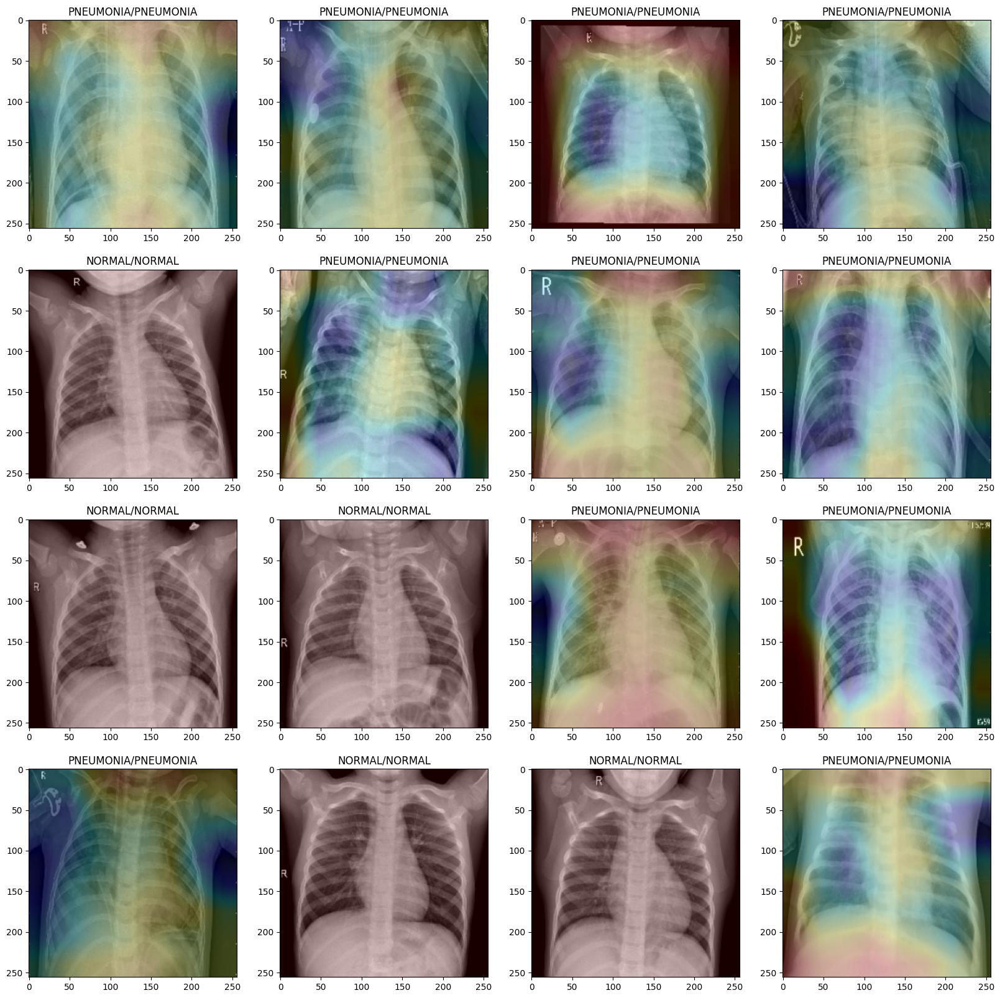

In [ ]:
class GradCAM(object):
    def __init__(self, model, alpha=0.8, beta=0.3):

        self.model = model
        self.alpha = alpha
        self.beta = beta

    def apply_heatmap(self, heatmap, image):
        heatmap = cv2.resize(heatmap, image.shape[:-1])
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(np.array(image).astype(np.float32), self.alpha,
                                           np.array(heatmap).astype(np.float32), self.beta, 0)

        return np.array(superimposed_img).astype(np.uint8)

    def gradCAM(self, x_test=None, name='black_max_pool_2', index_class=0):

        with tf.GradientTape() as tape:
            last_conv_layer = self.model.get_layer(name)
            grad_model = tf.keras.Model([self.model.input], [self.model.output, last_conv_layer.output])
            model_out, last_conv_layer = grad_model(np.expand_dims(x_test, axis=0))
            class_out = model_out[:, index_class]
            grads = tape.gradient(class_out, last_conv_layer)
            pooled_grads = tf.reduce_mean(grads, axis=(0, 3))
            last_conv_layer = tf.reduce_mean(last_conv_layer, axis=(0, 3))
        heatmap = tf.multiply(pooled_grads, last_conv_layer)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        heatmap = np.array(heatmap)
        return self.apply_heatmap(heatmap, x_test)
gradCam = GradCAM(loaded_model, alpha=0.8, beta=0.2)

row, col = 4, 4
fig, axes = plt.subplots(row, col, figsize=(20, 20))
for index, x in enumerate(test_ds.take(row * col)):
    x_test, y_test = x
    x_test = tf.image.resize(x_test, IMG_SIZE)
    y_pred = loaded_model.predict(tf.expand_dims(x_test, axis=0), verbose=0).argmax()
    grad_heatmap = gradCam.gradCAM(x_test, name='conv5_block3_out', index_class=y_test.numpy().argmax())
    axes[index // row, index % col].imshow(grad_heatmap)
    axes[index // row, index % col].set_title(f"{CLASS_NAMES[y_pred]}/{CLASS_NAMES[y_test.numpy().argmax()]}")

    if index == (row * col) - 1:
        break

plt.show()

# InceptionV3

In [ ]:
import tensorflow as tf

def create_model():
    inceptionv3 = tf.keras.applications.InceptionV3(include_top=False,weights="imagenet",input_shape=IMG_SIZE + [3])
    inceptionv3.trainable = False
    x = tf.keras.layers.GlobalAveragePooling2D()(inceptionv3.output)
    outputs = tf.keras.layers.Dense(len(CLASS_NAMES), activation="softmax")(x)
    model = tf.keras.Model(inputs=inceptionv3.input, outputs=outputs)

    model.compile(
        loss="categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

model = create_model()
model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 127, 127, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 127, 127, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 127, 127, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 125, 125, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 125, 125, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 125, 125, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 125, 125, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 125, 125, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 125, 125, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 62, 62, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 62, 62, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 62, 62, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 62, 62, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 60, 60, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 60, 60, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 21,806,882 (83.19 MB)

 Trainable params: 4,098 (16.01 KB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
class ModelCheckpointCustom(tf.keras.callbacks.Callback):

    def __init__(self, model_path, save_best_only=False):
        super(ModelCheckpointCustom, self).__init__()

        self.model_path = model_path
        self.save_best_only = save_best_only
        self.best_val_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):

        current_val_loss = 0 if logs['val_loss'] is None else logs['val_loss']

        if self.save_best_only and current_val_loss < self.best_val_loss:
            self.best_val_loss = current_val_loss
            self.model.save_weights(self.model_path)
        else:
            self.model.save_weights(self.model_path)

save_callbacks = ModelCheckpointCustom(model_path='/content/modelInceptionV3.weights.h5', save_best_only=True)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=5)


In [ ]:
EPOCHS = 10
history = model.fit(train, epochs=EPOCHS, validation_data=val, validation_steps=int(len(val) * .2),
                    callbacks=[early_stopping, save_callbacks])

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 126s 428ms/step - accuracy: 0.8512 - loss: 1.0873 - val_accuracy: 0.9326 - val_loss: 0.2350
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - accuracy: 0.9089 - loss: 0.4230 - val_accuracy: 0.9541 - val_loss: 0.1910
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9329 - loss: 0.3375 - val_accuracy: 0.9590 - val_loss: 0.1799
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - accuracy: 0.9317 - loss: 0.3234 - val_accuracy: 0.9131 - val_loss: 0.4443
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - accuracy: 0.9347 - loss: 0.3598 - val_accuracy: 0.8789 - val_loss: 0.7572
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9395 - loss: 0.3077

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


163/163 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - accuracy: 0.9395 - loss: 0.3076 - val_accuracy: 0.8854 - val_loss: 0.3865
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 61s 333ms/step - accuracy: 0.9420 - loss: 0.2858 - val_accuracy: 0.9121 - val_loss: 0.4763
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - accuracy: 0.9447 - loss: 0.2718 - val_accuracy: 0.9365 - val_loss: 0.3285
Epoch 9/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - accuracy: 0.9466 - loss: 0.2914 - val_accuracy: 0.9141 - val_loss: 0.4588
Epoch 10/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - accuracy: 0.9484 - loss: 0.2608 - val_accuracy: 0.9170 - val_loss: 0.4713


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


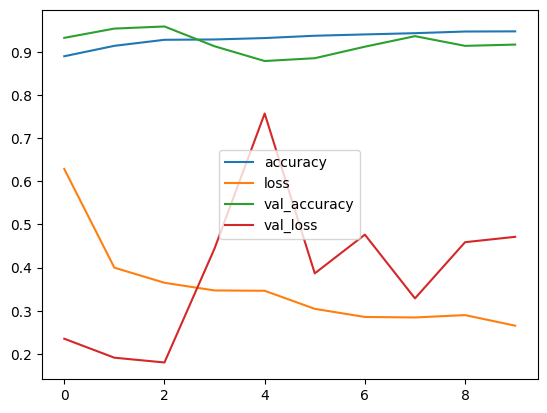

In [ ]:
pd.DataFrame(history.history).plot()
loaded_model = create_model()
loaded_model.load_weights("/content/modelInceptionV3.weights.h5")

In [ ]:
y_pred = loaded_model.evaluate(test)
print("Testing accuracy:", y_pred[1])

163/163 ━━━━━━━━━━━━━━━━━━━━ 66s 76ms/step - accuracy: 0.9089 - loss: 0.5157
Testing accuracy: 0.9074003100395203


Accuracy: 0.9074003067484663
Precision: 0.9421520143802543
Recall: 0.8211296336388347
F1-score: 0.8613056698666808


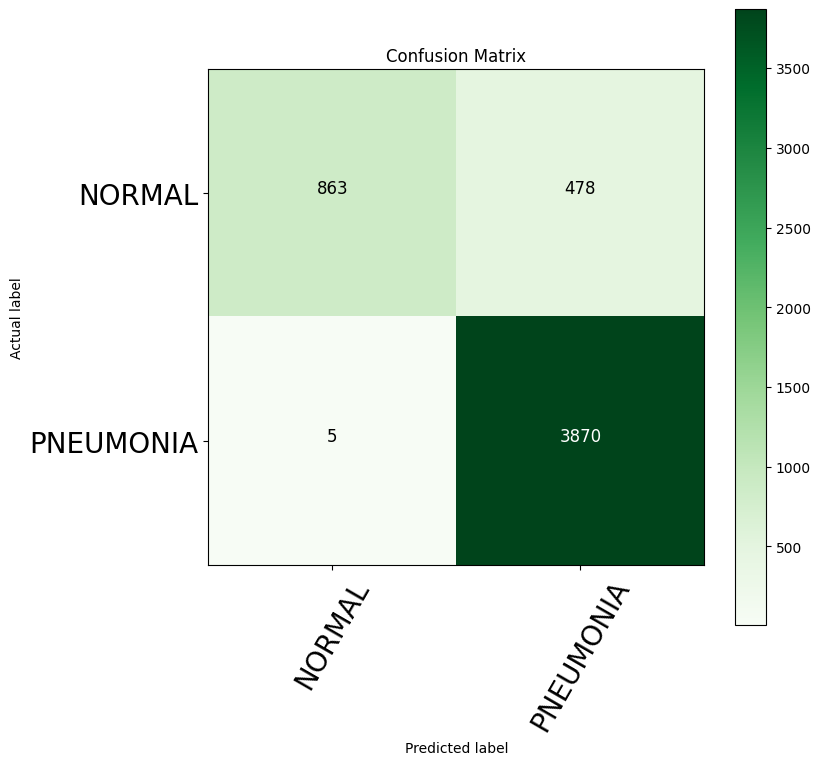

In [ ]:
def conf_matrix(y_test=None, y_pred=None, class_names=None):

    cm = confusion_matrix(y_test, y_pred)

    fig, ax = plt.subplots(figsize=(8, 8))
    a = ax.matshow(cm, cmap=plt.cm.Greens)

    fig.colorbar(a)

    ax.set(title="Confusion Matrix",
             xlabel="Predicted label",
             ylabel="Actual label",
             xticks=np.arange(len(class_names)),
             yticks=np.arange(len(class_names)),
             xticklabels=class_names,
             yticklabels=class_names)

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=60, fontsize=20)
    plt.yticks(fontsize=20)

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i, j]}",
                  horizontalalignment="center", color="black" if cm[i, j] < (cm.max() + cm.min()) / 2 else "white",
                  fontsize=12)
y_pred = []
y_truth = []

for x, y in test:
    y_pred.extend(loaded_model.predict([x], verbose=0).round())
    y_truth.extend(y.numpy())

y_true = np.array(y_truth).argmax(axis=1)
y_prediction = np.array(y_pred).argmax(axis=1)
accuracy = accuracy_score(y_true, y_prediction)
precision = precision_score(y_true, y_prediction, average='macro')
recall = recall_score(y_true, y_prediction, average='macro')
f1 = f1_score(y_true, y_prediction, average='macro')
confusion_mat = confusion_matrix(y_true, y_prediction)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
conf_matrix(y_test=y_true, y_pred=y_prediction, class_names=CLASS_NAMES)

<ipython-input-13-1aa8f9387c81>:28: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap)
<ipython-input-13-1aa8f9387c81>:10: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)


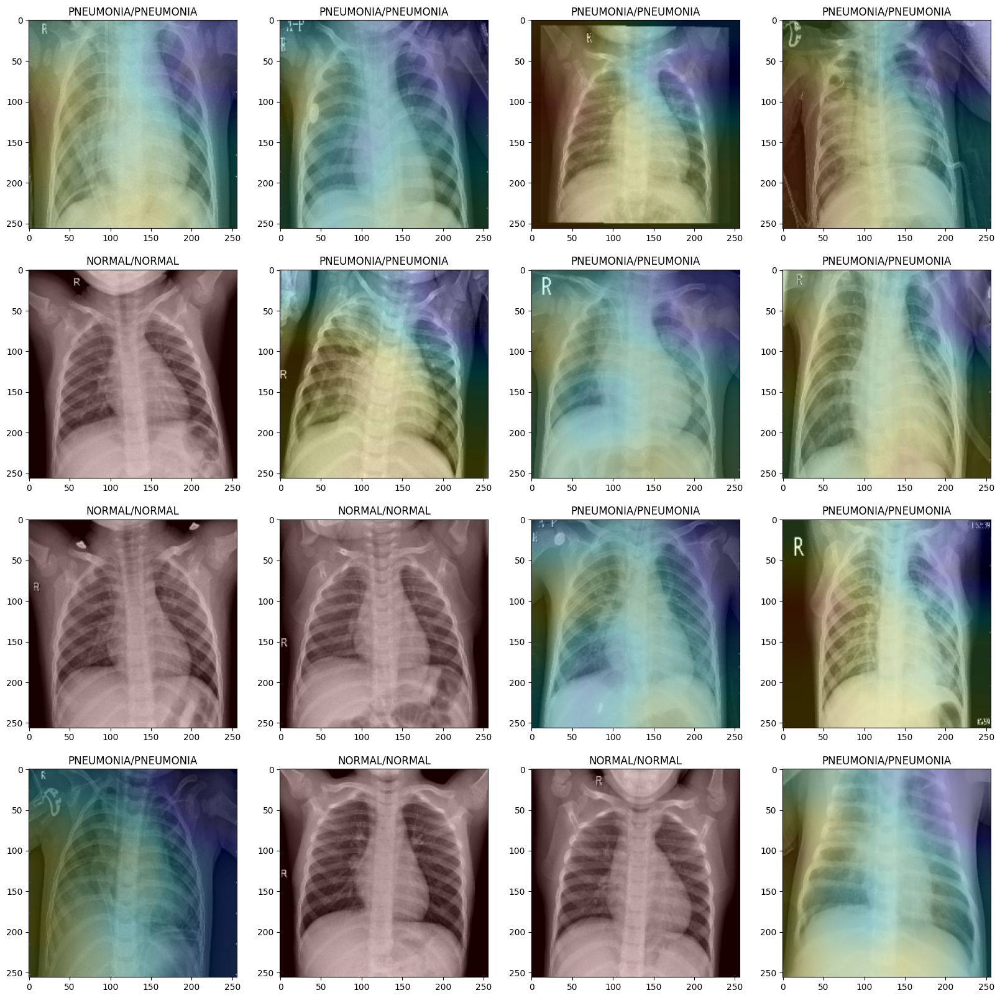

In [ ]:
class GradCAM(object):
    def __init__(self, model, alpha=0.8, beta=0.3):

        self.model = model
        self.alpha = alpha
        self.beta = beta

    def apply_heatmap(self, heatmap, image):
        heatmap = cv2.resize(heatmap, image.shape[:-1])
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(np.array(image).astype(np.float32), self.alpha,
                                           np.array(heatmap).astype(np.float32), self.beta, 0)

        return np.array(superimposed_img).astype(np.uint8)

    def gradCAM(self, x_test=None, name='black_max_pool_2', index_class=0):

        with tf.GradientTape() as tape:
            last_conv_layer = self.model.get_layer(name)
            grad_model = tf.keras.Model([self.model.input], [self.model.output, last_conv_layer.output])
            model_out, last_conv_layer = grad_model(np.expand_dims(x_test, axis=0))
            class_out = model_out[:, index_class]
            grads = tape.gradient(class_out, last_conv_layer)
            pooled_grads = tf.reduce_mean(grads, axis=(0, 3))
            last_conv_layer = tf.reduce_mean(last_conv_layer, axis=(0, 3))
        heatmap = tf.multiply(pooled_grads, last_conv_layer)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        heatmap = np.array(heatmap)
        return self.apply_heatmap(heatmap, x_test)
gradCam = GradCAM(loaded_model, alpha=0.8, beta=0.2)

row, col = 4, 4
fig, axes = plt.subplots(row, col, figsize=(20, 20))
for index, x in enumerate(test_ds.take(row * col)):
    x_test, y_test = x
    x_test = tf.image.resize(x_test, IMG_SIZE)
    y_pred = loaded_model.predict(tf.expand_dims(x_test, axis=0), verbose=0).argmax()
    grad_heatmap = gradCam.gradCAM(x_test, name='mixed10', index_class=y_test.numpy().argmax())
    axes[index // row, index % col].imshow(grad_heatmap)
    axes[index // row, index % col].set_title(f"{CLASS_NAMES[y_pred]}/{CLASS_NAMES[y_test.numpy().argmax()]}")

    if index == (row * col) - 1:
        break

plt.show()